# FFT and PINN Option Pricing

We now calibrate the FFT and PINN option pricing models using differential evolution.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import torch
import numpy as np
import pandas as pd

import matplotlib_inline
%matplotlib inline
%matplotlib inline

import matplotlib.pyplot as plt
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
%config InlineBackend.figure_formats = ['retina'] 

from pathlib import Path
from scipy.optimize import Bounds, NonlinearConstraint
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

from FFTOptionPricing.FFT_option_pricing import OptionPricingCarrMadan, CalibrationFFT, split_test_training_df
from FFTOptionPricing.run_differential_evol import run_differential_evolution_with_polish as run_differential_evolution_FFT

from PINNOptionPricing.PINN import PINN, CalibrationPINN
from PINNOptionPricing.run_differential_evol import run_differential_evolution_with_polish as run_differential_evolution_PINN

# 1. Importing data

In [3]:
filepaths_options = {
    'BNPE': '/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Data/0#BNPE*.EX_option_prices.xlsx',
    'SAPE': '/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Data/0#SAPE*.EX_option_prices.xlsx'
}

In [4]:
short_rate_params = pd.read_csv('/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Code/CIRPlusPlusResults/short_rate_params.csv').iloc[0]

VAL_DATE = str(short_rate_params['VAL_DATE'])
r0 = float(short_rate_params['r0'])
Theta_r = short_rate_params[['x0', 'kappa_r', 'theta_r', 'sigma_r']].astype(float).to_numpy()
Svensson_params = short_rate_params[['beta0', 'beta1', 'beta2', 'beta3', 'a1', 'a2']].astype(float).to_numpy()

print(f'Theta_r = {Theta_r}')
print(f'r0 = {r0}')

Theta_r = [0.10070984 0.01024475 0.03245518 0.02578739]
r0 = 0.0191672169145129


# 2. FFT Calibration

In [5]:
#initializing parameters and creating training and test datasets
t = 0
CarrMadan_params = [0.25, 2**12, 1.5]

moneyness_pct_lower = 70
moneyness_pct_upper = 100

#kappa_nu, theta_nu, sigma_nu, nu_t, rho
lower = np.array([0.1, 0.001, 0.01, 0.01, -0.99])
upper = np.array([5.0, 0.5, 0.75, 0.3, 0.99])
bounds = Bounds(lower, upper)

constraint_Heston = NonlinearConstraint(lambda th: th[2]**2 - 2*th[0]*th[1], -np.inf, 0.0)

print(f'Lower bound: {lower}')
print(f'Upper bound: {upper}')

train_dfs = []
test_dfs = []
stock_prices = []
tickers = []

for TKR in filepaths_options:
    train_df, test_df, S0 = split_test_training_df(filepath = filepaths_options[TKR], cutoff_year_lower=0.0, cutoff_year_upper=3.0, moneyness_pct_lower=moneyness_pct_lower, moneyness_pct_upper=moneyness_pct_upper, test_size=0.2, random_state=42)
    
    train_dfs.append(train_df)
    test_dfs.append(test_df)
    
    tickers.append(TKR)
    stock_prices.append(S0)

print('Data split into training and test datasets')

Lower bound: [ 0.1    0.001  0.01   0.01  -0.99 ]
Upper bound: [5.   0.5  0.75 0.3  0.99]
Data split into training and test datasets


## 2.1 Calibration

Calibration using differential evaluation.

In [6]:
#storing results and used data
results_FFT = []
calibrations_FFT = []

lambda_nu = 1
penalty = False
strategy = 'best2exp'

for i, TKR in enumerate(filepaths_options):
    print(f'------------------------------------------------------------------ Processing stock: {TKR} ------------------------------------------------------------------')
    print()
    
    train_df = train_dfs[i]
    test_df = test_dfs[i]
    S0 = stock_prices[i]

    print(f'S0={S0}')
    print(f'Length of training data: {len(train_df)}')
    print(f'Length of test data: {len(test_df)}')
    print()

    #rel_close_vega_error, sq_error
    calibration = CalibrationFFT(df=train_df, S_t=S0, t=t, r_t=r0, VAL_DATE=VAL_DATE, Theta_r=Theta_r, Svensson_params=Svensson_params, Theta_nu_init=np.array([0.1, 0.1, 0.1, 0.1, 0.1]), CarrMadan_params=CarrMadan_params, n_tau=701)

    result = run_differential_evolution_FFT(
        class_=calibration,
        args=(lambda_nu, penalty,),
        bounds=bounds,
        constraint=constraint_Heston,
        strategy=strategy
    )

    print()
    print("DE best:", result.x, "f=", result.fun)
    results_FFT.append(result)
    calibrations_FFT.append(calibration)
    print()

    print(f'------------------------------------------------------------------ Finished processing stock: {TKR} ------------------------------------------------------------------')
    print()

------------------------------------------------------------------ Processing stock: BNPE ------------------------------------------------------------------

S0=68.72
Length of training data: 226
Length of test data: 60

differential_evolution step 1: f(x)= 0.7235169886700064
[DE] conv=0.000 best_x≈[1.80899218 0.02403449 0.04033399 0.09430494 0.33520508]
differential_evolution step 2: f(x)= 0.5937839223724081
[DE] conv=0.000 best_x≈[ 2.80306543  0.02338308  0.03169434  0.08394025 -0.15040347]
differential_evolution step 3: f(x)= 0.5937839223724081
[DE] conv=0.000 best_x≈[ 2.80306543  0.02338308  0.03169434  0.08394025 -0.15040347]
differential_evolution step 4: f(x)= 0.5937839223724081
[DE] conv=0.000 best_x≈[ 2.80306543  0.02338308  0.03169434  0.08394025 -0.15040347]
differential_evolution step 5: f(x)= 0.5293620411997251
[DE] conv=0.000 best_x≈[3.87882167 0.03634728 0.03983567 0.09531993 0.81821824]
differential_evolution step 6: f(x)= 0.5293620411997251
[DE] conv=0.000 best_x≈[3.87

## 2.2 Model Evaluation

In [7]:
def model_prices_FFT(df, calibration, S0, r0, Svensson_params, Theta_r, Theta_nu, CarrMadan_params):
    df = df.copy()
    df['FFT_price'] = np.nan
    df['FFT_error'] = np.nan

    t = 0.0
    maturities = np.sort(df['time_to_maturity_years'].dropna().unique())

    for T in maturities:
        P_t_T = calibration.P(t, T)

        pricer = OptionPricingCarrMadan( t=t, T=float(T), P_t_T=P_t_T, init_params=[S0, r0, S0], Svensson_params=Svensson_params, Theta_r=Theta_r, Theta_nu=Theta_nu, CarrMadan_params=CarrMadan_params, n_tau=1001)
        K_grid, C_grid = pricer.Carr_Madan_FFT_Call_Prices()

        rows = (df['time_to_maturity_years'].values == T)
        if not np.any(rows):
            continue

        strikes = df.loc[rows, 'strike'].to_numpy(dtype=float)
        market_prices = df.loc[rows, 'close'].to_numpy(dtype=float)

        in_range = (strikes >= K_grid[0]) & (strikes <= K_grid[-1])
        model = np.full_like(strikes, np.nan, dtype=float)
        model[in_range] = np.interp(strikes[in_range], K_grid, C_grid)

        df.loc[rows, 'FFT_price'] = model
        df.loc[rows, 'FFT_error'] = model - market_prices
    return df

In [8]:
errors_train = []
df_trains = []

for i, ticker in enumerate(tickers):
    df_train = train_dfs[i]
    
    S0 = stock_prices[i]
    calibration = calibrations_FFT[i]
    Theta_nu = results_FFT[i].x    
    maturities = np.sort(df_train['time_to_maturity_years'].unique())

    df_train = model_prices_FFT(train_dfs[i], calibrations_FFT[i], S0, r0, Svensson_params, Theta_r, Theta_nu, CarrMadan_params)
    df_trains.append(df_train)
    
    #computing error metrics
    MAE = mean_absolute_error(y_true=df_train['close'], y_pred=df_train['FFT_price'])
    RMSE = np.sqrt(mean_squared_error(y_true=df_train['close'], y_pred=df_train['FFT_price']))
    MAPE = mean_absolute_percentage_error(y_true=df_train['close'], y_pred=df_train['FFT_price']) * 100

    errors_train.append({
        'TKR': ticker,
        'MAE': MAE,
        'RMSE': RMSE,
        'MAPE': MAPE
    })

    for T in maturities:
        #train
        mask = (df_train['time_to_maturity_years'] == T)
        strikes = df_train.loc[mask, 'strike'].to_numpy()
        market_close = df_train.loc[mask, 'close'].to_numpy()
        model_price = df_train.loc[mask, 'FFT_price'].to_numpy()
        model_error = df_train.loc[mask, 'FFT_error'].to_numpy()

train_errors_df_FFT = pd.DataFrame(errors_train, columns=['TKR', 'MAE', 'RMSE', 'MAPE'])
train_errors_df_FFT.to_excel('/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Code/FFTResults/CalibrationResults/training_errors.xlsx')

In [9]:
errors_test = []
df_tests = []

for i, ticker in enumerate(tickers):
    df_test = test_dfs[i]
    
    S0 = stock_prices[i]
    calibration = calibrations_FFT[i]
    Theta_nu = results_FFT[i].x    
    maturities = np.sort(df_test['time_to_maturity_years'].unique())

    df_test = model_prices_FFT(test_dfs[i], calibrations_FFT[i], S0, r0, Svensson_params, Theta_r, Theta_nu, CarrMadan_params)
    df_tests.append(df_test)
    
    #computing error metrics
    MAE = mean_absolute_error(y_true=df_test['close'], y_pred=df_test['FFT_price'])
    RMSE = np.sqrt(mean_squared_error(y_true=df_test['close'], y_pred=df_test['FFT_price']))
    MAPE = mean_absolute_percentage_error(y_true=df_test['close'], y_pred=df_test['FFT_price']) * 100

    errors_test.append({
        'TKR': ticker,
        'MAE': MAE,
        'RMSE': RMSE,
        'MAPE': MAPE
    })

    for T in maturities:
        #train
        mask = (df_train['time_to_maturity_years'] == T)
        strikes = df_train.loc[mask, 'strike'].to_numpy()
        market_close = df_train.loc[mask, 'close'].to_numpy()
        model_price = df_train.loc[mask, 'FFT_price'].to_numpy()
        model_error = df_train.loc[mask, 'FFT_error'].to_numpy()

test_errors_df_FFT = pd.DataFrame(errors_test, columns=['TKR', 'MAE', 'RMSE', 'MAPE'])
test_errors_df_FFT.to_excel('/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Code/FFTResults/CalibrationResults/test_errors.xlsx')

In [10]:
rows = []
for ticker, S0, result in zip(tickers, stock_prices, results_FFT):
    x0, kappa_r, theta_r, sigma_r = Theta_r
    beta0, beta1, beta2, beta3, a1, a2 = Svensson_params
    kappa_nu, theta_nu, sigma_nu, nu_t, rho = result.x

    rows.append({
        'TKR': ticker,
        'S0': S0,
        'beta0': beta0,
        'beta1': beta1,
        'beta2': beta2,
        'beta3': beta3,
        'a1': a1,
        'a2': a2,
        'r0': r0, 
        'x0': x0,
        'kappa_r': kappa_r,
        'theta_r': theta_r,
        'sigma_r': sigma_r,
        'kappa_nu': kappa_nu,
        'theta_nu': theta_nu,
        'sigma_nu': sigma_nu,
        'nu0': nu_t,
        'rho': rho
    })

df_FFT = pd.DataFrame(rows, columns=['TKR', 'S0', 'r0', 'nu0', 'beta0', 'beta1', 'beta2', 'beta3', 'a1', 'a2', 'x0', 'kappa_r', 'theta_r', 'sigma_r', 'kappa_nu', 'theta_nu', 'sigma_nu', 'rho'])
df_FFT.to_excel('/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Code/FFTResults/CalibrationResults/calibration_results.xlsx')

## 2.3 Plots

Train:


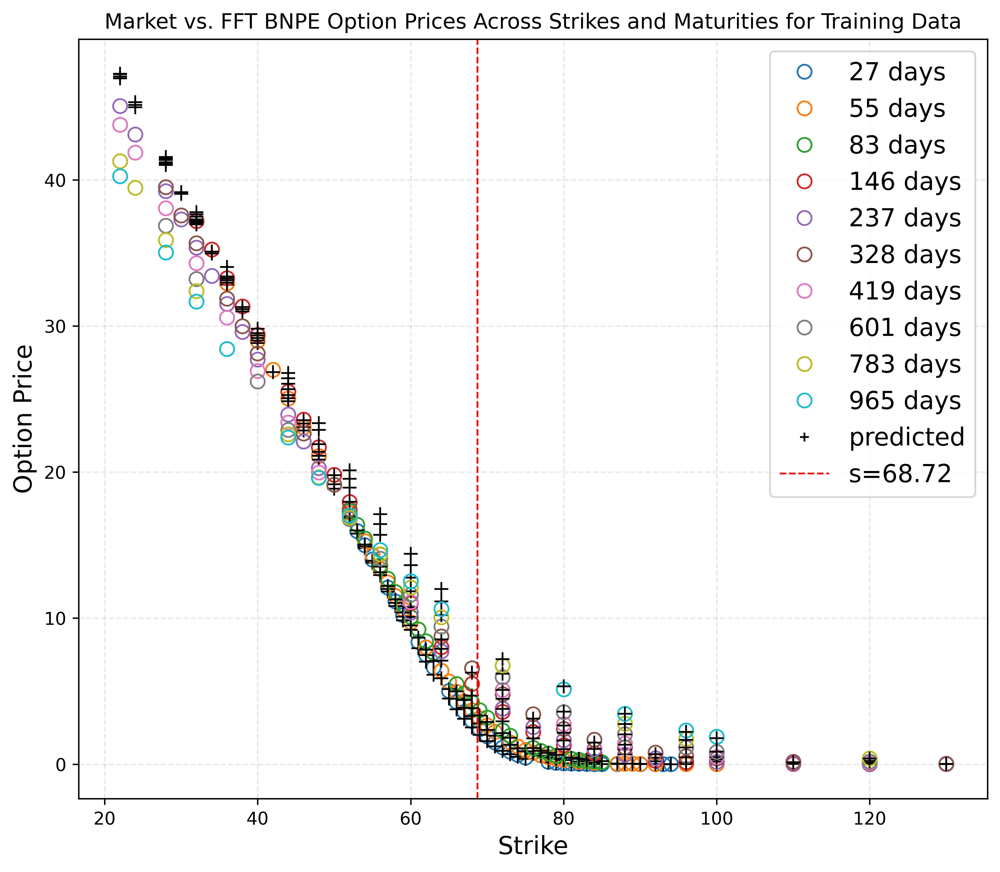

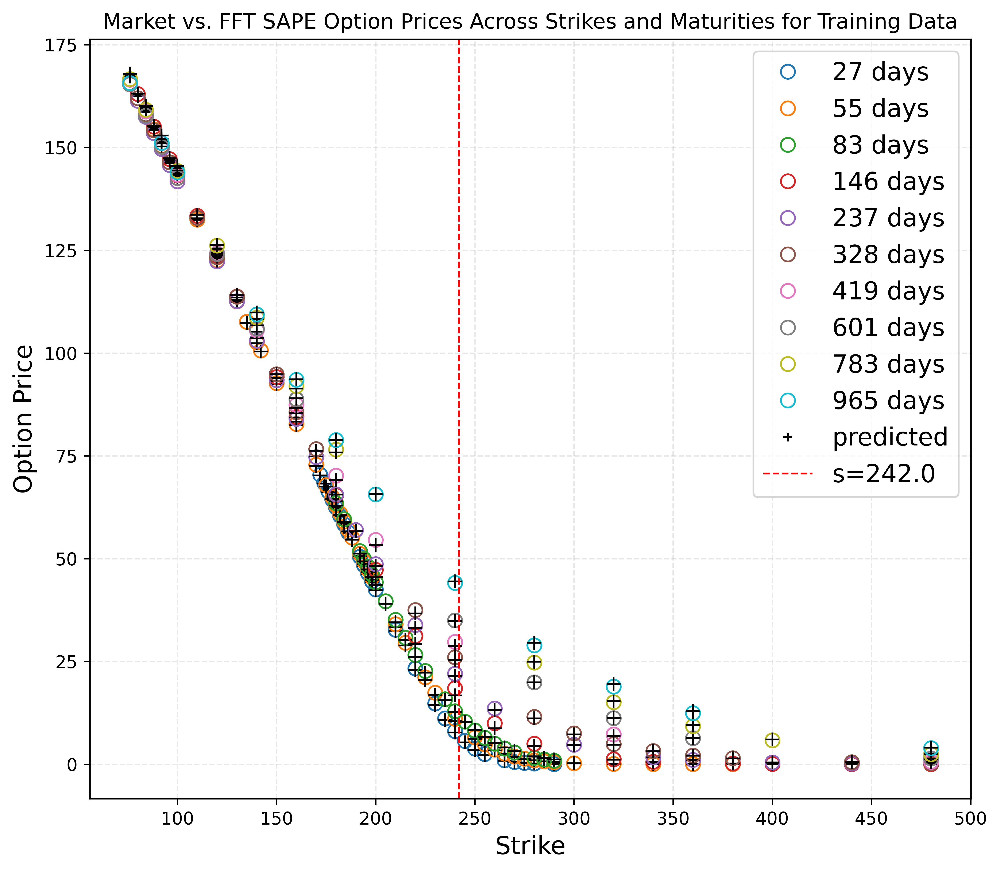

Test:


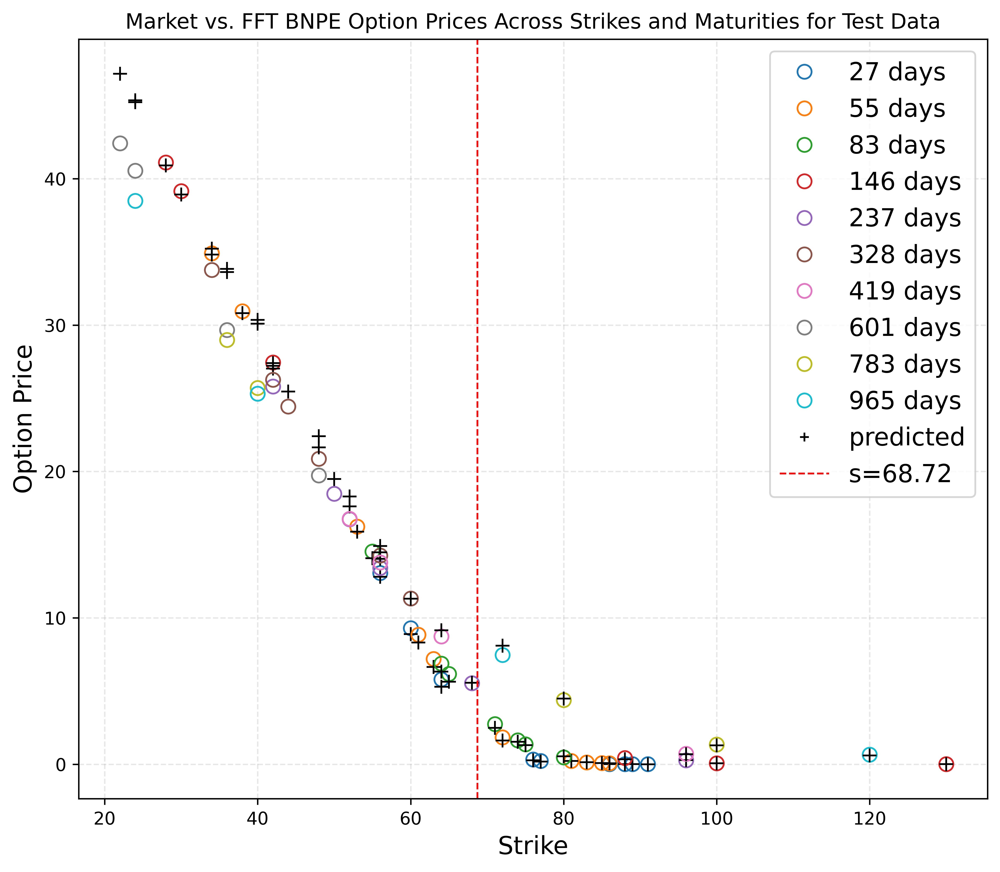

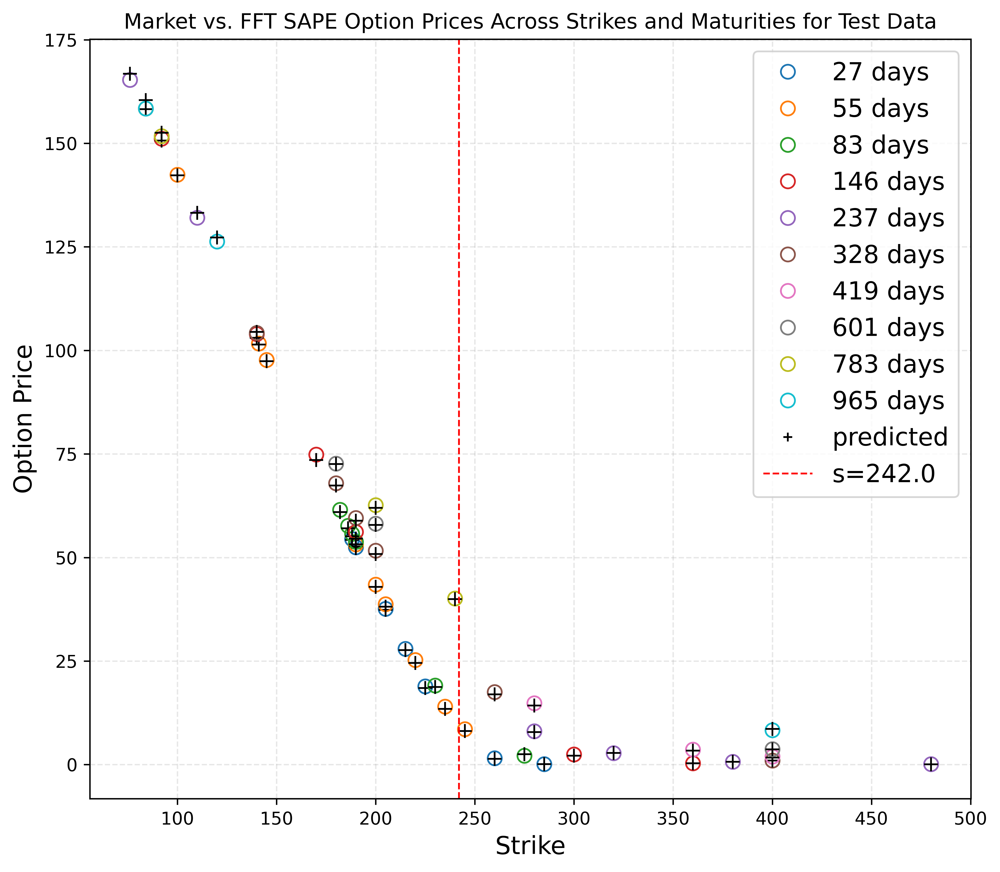

In [29]:
def plot_strike_slices(df, S0, plot_title):
    ttms = np.sort(df["time_to_maturity_years"].unique())
    ttm_days = (ttms * 365).astype(int)

    cmap = plt.get_cmap("tab10")
    fig, ax = plt.subplots(figsize=(8, 7), dpi=300)

    for i, (T, T_days) in enumerate(zip(ttms, ttm_days)):
        sub = df[df["time_to_maturity_years"] == T].sort_values("strike")
        color = cmap(i % 10)

        ax.plot(sub["strike"], sub["close"], marker="o", linestyle="none", markersize=8, markerfacecolor="none", markeredgecolor=color, label=f"{T_days} days")
        ax.plot(sub["strike"], sub["FFT_price"], marker="+", linestyle="none", markersize=8, color="k", label="_nolegend_")

    ax.plot([], [], marker="+", linestyle="none", color="k", markersize=5, label="predicted")

    ax.set_xlabel("Strike", size=14)
    ax.set_ylabel("Option Price", size=14)
    ax.set_title(plot_title)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.axvline(x=S0, linestyle='--', linewidth=1, label=f's={S0}', color='red')
    ax.legend(loc="upper right", fontsize=14)
    fig.tight_layout()
    plt.show()

print('Train:')
for i, df_train in enumerate(df_trains):
    ticker = tickers[i]
    S0 = stock_prices[i]
    plot_title = f'Market vs. FFT {ticker} Option Prices Across Strikes and Maturities for Training Data'
    plot_strike_slices(df_train, S0, plot_title)

print('Test:')
for i, df_test in enumerate(df_tests):
    ticker = tickers[i]
    S0 = stock_prices[i]
    plot_title = f'Market vs. FFT {ticker} Option Prices Across Strikes and Maturities for Test Data'
    plot_strike_slices(df_test, S0, plot_title)

Train:


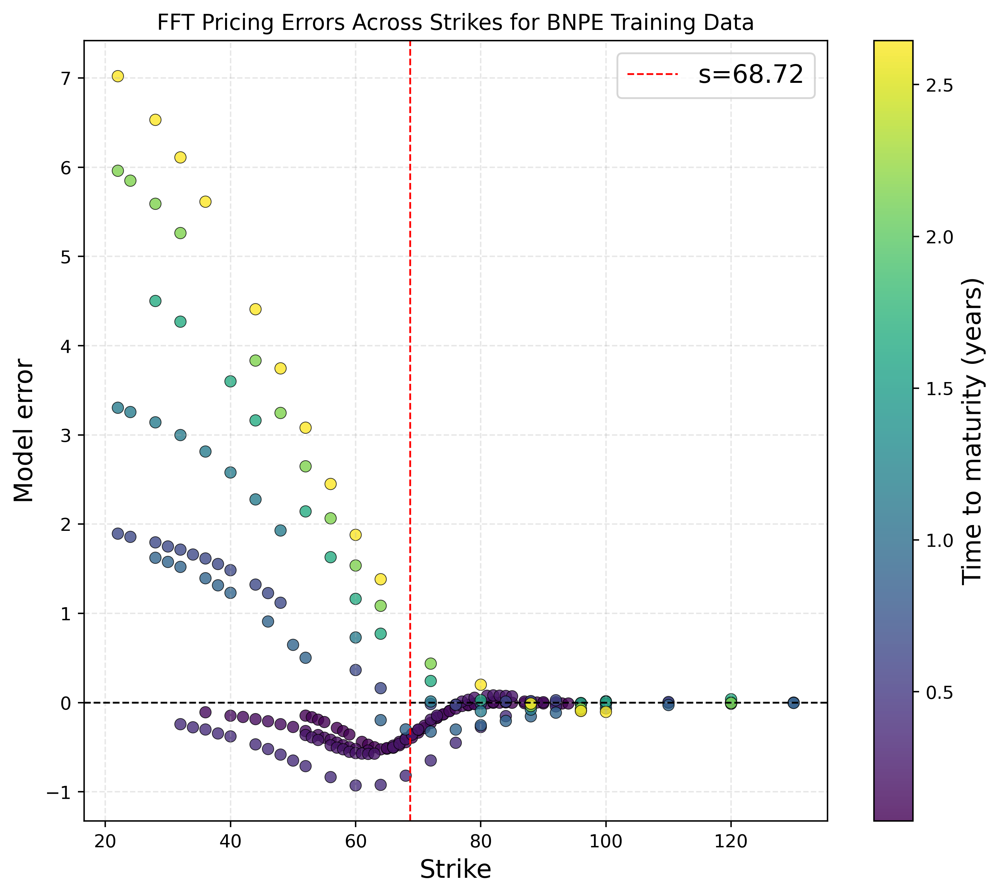

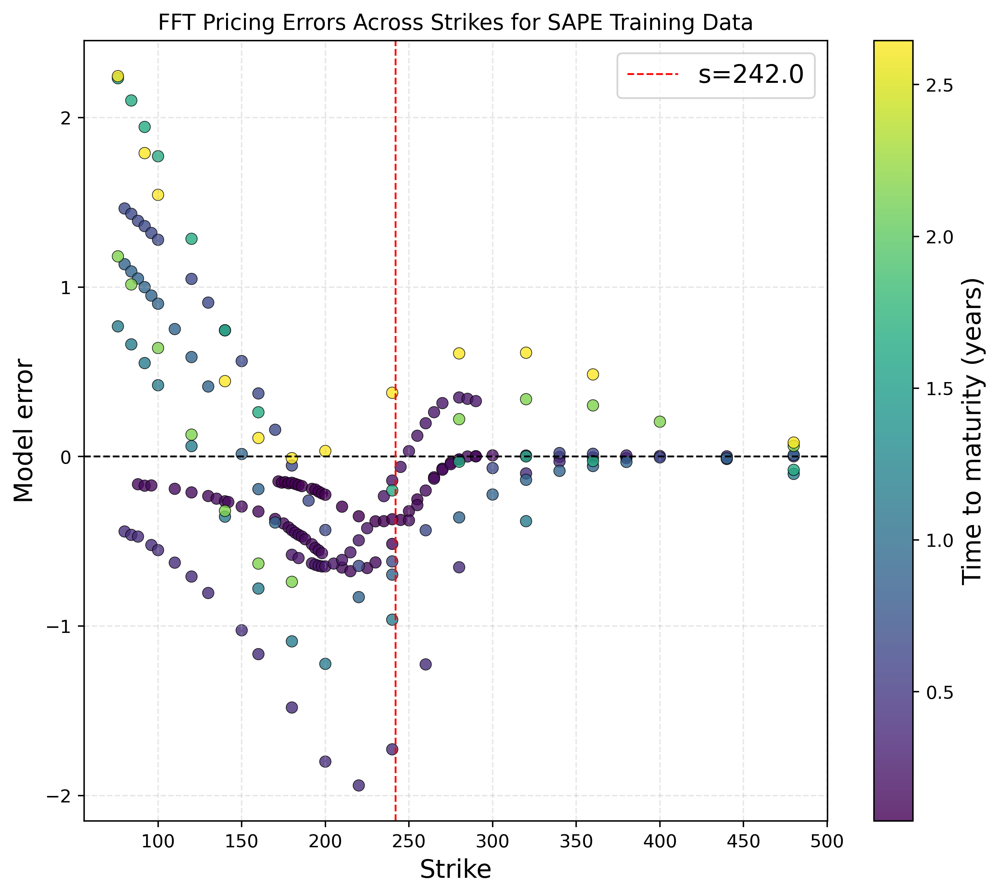

Test:


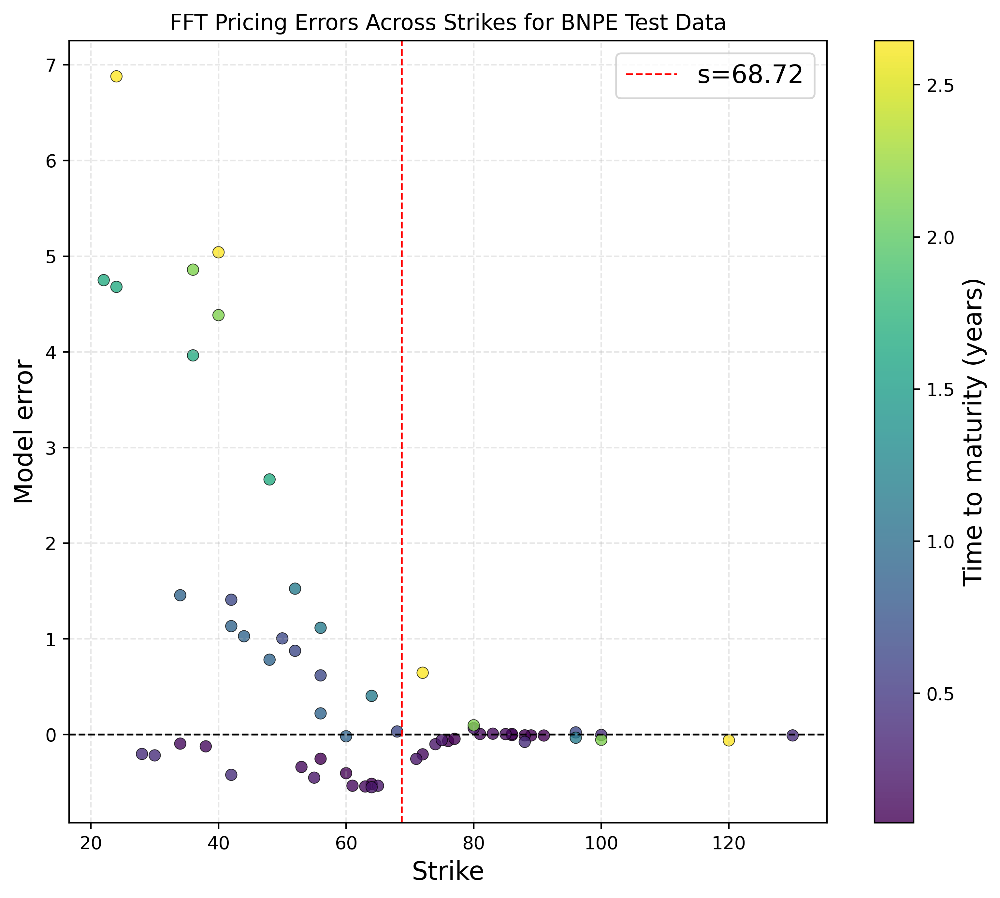

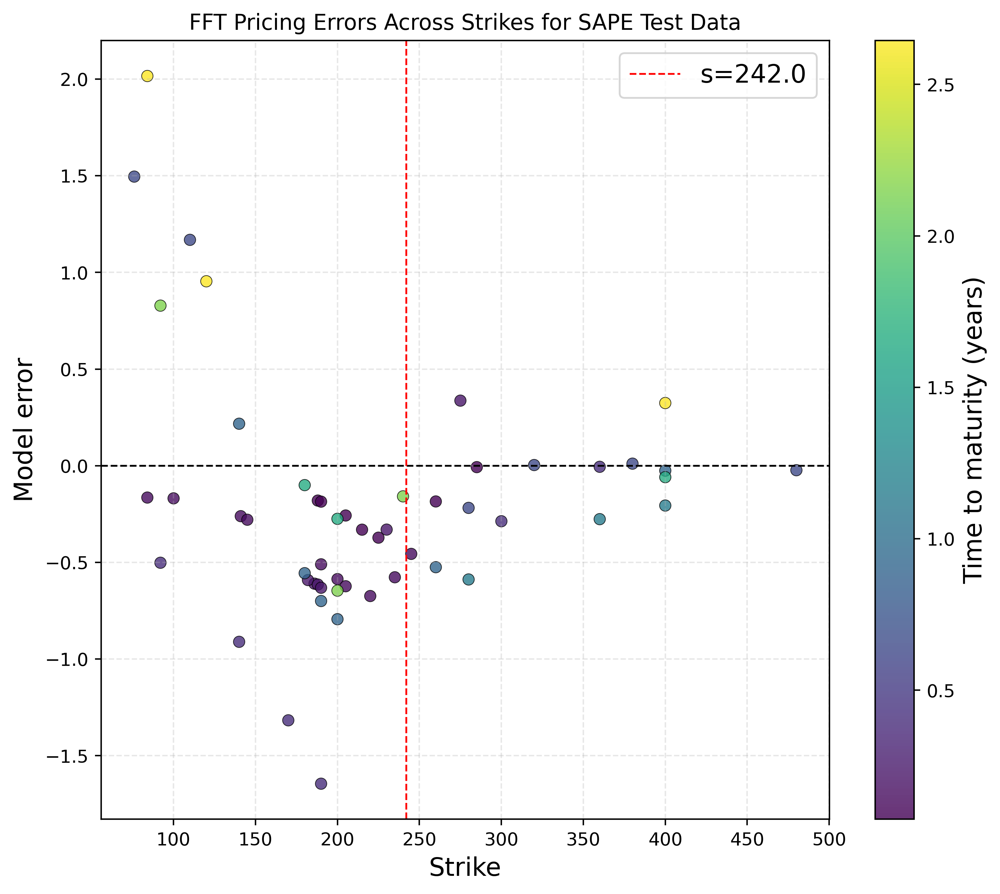

In [12]:
def plot_residuals_vs_strike(df, S0, plot_title):
    df = df.copy()
    
    fig, ax = plt.subplots(figsize=(8, 7), dpi=200)
    sc = ax.scatter(df["strike"], df["FFT_error"], c=df["time_to_maturity_years"], cmap="viridis", s=40, alpha=0.8, marker="o", edgecolors="k", linewidths=0.4)

    ax.axhline(0.0, color="k", linestyle="--", lw=1)
    ax.axvline(x=S0, linestyle='--', linewidth=1, label=f's={S0}', color='red')

    ax.set_xlabel('Strike', size=14)
    ax.set_ylabel('Model error', size=14)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.set_title(plot_title)
    ax.legend(loc="upper right", fontsize=14)

    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label("Time to maturity (years)", size=14)

    fig.tight_layout()
    plt.show()

print('Train:')
for i, df_train in enumerate(df_trains):
    ticker = tickers[i]
    S0 = stock_prices[i]
    plot_title = f'FFT Pricing Errors Across Strikes for {ticker} Training Data'
    plot_residuals_vs_strike(df_train, S0, plot_title)

print('Test:')
for i, df_test in enumerate(df_tests):
    ticker = tickers[i]
    S0 = stock_prices[i]
    plot_title = f'FFT Pricing Errors Across Strikes for {ticker} Test Data'
    plot_residuals_vs_strike(df_test, S0, plot_title)

## 2.4 Error metrics

In [13]:
train_errors_df_FFT

,TKR,MAE,RMSE,MAPE
0,BNPE,0.846981,1.602981,11.715257
1,SAPE,0.488784,0.684435,3.301063


In [14]:
test_errors_df_FFT

,TKR,MAE,RMSE,MAPE
0,BNPE,0.931293,1.819626,13.292948
1,SAPE,0.486216,0.645636,2.841276


In [15]:
df_FFT

,TKR,S0,r0,nu0,beta0,beta1,beta2,beta3,a1,a2,x0,kappa_r,theta_r,sigma_r,kappa_nu,theta_nu,sigma_nu,rho
0,BNPE,68.72,0.019167,0.087069,0.009864,0.009304,-0.003415,0.057249,0.533535,0.072648,0.10071,0.010245,0.032455,0.025787,4.031099,0.030770,0.497739,-0.010635
1,SAPE,242.00,0.019167,0.062871,0.009864,0.009304,-0.003415,0.057249,0.533535,0.072648,0.10071,0.010245,0.032455,0.025787,4.205445,0.067172,0.749677,-0.020873


# 3. PINN

## 3.1 Importing model

In [16]:
device = torch.device('cpu')

model_name = '4x512_3x_strike_50'
ckpt_path = f'/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Code/PINNResults/TrainedModels/{model_name}.pt'

ckpt = torch.load(ckpt_path, map_location=device)
configuration = ckpt['config']

PINN_model = PINN(
    strike_price=configuration['strike_price'],
    bounds_S=configuration['bounds_S'],
    bounds_r=configuration['bounds_r'],
    bounds_nu=configuration['bounds_nu'],
    bounds_rho=configuration['bounds_rho'],
    bounds_time=configuration['bounds_time'],
    boundary_loss_weights=configuration['boundary_loss_weights'],
    PINN_params=configuration['PINN_params'],
    Theta_r=configuration['Theta_r'],
    Svensson_params=configuration['Svensson_params'],
).to(device)

PINN_model.load_state_dict(ckpt["model_state"])
PINN_model.eval()

print(configuration)

{'PINN_params': [9, 512, 5, 10000, 50000], 'bounds_S': [5.0, 150], 'bounds_r': [0.01, 0.03], 'bounds_nu': [[0.01, 0.3], [0.1, 5.0], [0.001, 0.5], [0.01, 0.75]], 'bounds_rho': [-0.99, 0.99], 'bounds_time': [0.0, 3.0], 'Theta_r': [0.10070984, 0.01024475, 0.03245518, 0.02578739], 'Svensson_params': [0.00986355, 0.00930366, -0.00341514, 0.05724899, 0.53353498, 0.07264795], 'strike_price': 50, 'boundary_loss_weights': [1, 1, 1, 1], 'dtype': 'torch.float32', 'epochs': [500, 1000, 1500, 2000, 2000], 'lr': [0.005, 0.002, 0.001, 0.0001, 1e-05]}


## 3.2 Calibration

In [17]:
#bounds_nu = [[nu_min, nu_max], [kappa_nu_min, kappa_nu_max], [theta_nu_min, theta_nu_max], [sigma_nu_min, sigma_nu_max]]
bounds_nu = configuration['bounds_nu']
bounds_rho = configuration['bounds_rho']

nu_min, nu_max = bounds_nu[0]
kappa_nu_min, kappa_nu_max = bounds_nu[1]
theta_nu_min, theta_nu_max = bounds_nu[2]
sigma_nu_min, sigma_nu_max = bounds_nu[3]
rho_min, rho_max = bounds_rho

lower = np.array([kappa_nu_min, theta_nu_min, sigma_nu_min, nu_min, rho_min])
upper = np.array([kappa_nu_max, theta_nu_max, sigma_nu_max, nu_max, rho_max])
bounds = Bounds(lower, upper)

constraint_Heston = NonlinearConstraint(lambda th: th[2]**2 - 2*th[0]*th[1], -np.inf, 0.0)

#storing results and used data
results = []
calibrations = []

lambda_nu = 1

for i, TKR in enumerate(filepaths_options):
    print(f'------------------------------------------------------------------ Processing stock: {TKR} ------------------------------------------------------------------')
    print()
    
    train_df = train_dfs[i]
    test_df = test_dfs[i]
    S0 = stock_prices[i]

    print(f'S0={S0}')
    print(f'Length of training data: {len(train_df)}')
    print(f'Length of test data: {len(test_df)}')
    print()

    calibration = CalibrationPINN(PINN_model=PINN_model, df=train_df, t=0.0, S_0 = S0, r_0=r0)

    result = run_differential_evolution_PINN(
        class_=calibration,
        args=(lambda_nu,),
        bounds=bounds,
        constraint=constraint_Heston
    )

    print("DE best:", result.x, "f=", result.fun)
    results.append(result)
    calibrations.append(calibration)
    print()

    print(f'------------------------------------------------------------------ Finished processing stock: {TKR} ------------------------------------------------------------------')
    print()

------------------------------------------------------------------ Processing stock: BNPE ------------------------------------------------------------------

S0=68.72
Length of training data: 226
Length of test data: 60

differential_evolution step 1: f(x)= 0.808048849398894
[DE] conv=0.000 best_x≈[ 1.77899907  0.1095596   0.14021848  0.02416772 -0.75526935]
differential_evolution step 2: f(x)= 0.3998179642233868
[DE] conv=0.000 best_x≈[ 1.78174658  0.0191784   0.09410234  0.03702142 -0.91221813]
differential_evolution step 3: f(x)= 0.3998179642233868
[DE] conv=0.000 best_x≈[ 1.78174658  0.0191784   0.09410234  0.03702142 -0.91221813]
differential_evolution step 4: f(x)= 0.3998179642233868
[DE] conv=0.000 best_x≈[ 1.78174658  0.0191784   0.09410234  0.03702142 -0.91221813]
differential_evolution step 5: f(x)= 0.3998179642233868
[DE] conv=0.000 best_x≈[ 1.78174658  0.0191784   0.09410234  0.03702142 -0.91221813]
differential_evolution step 6: f(x)= 0.3998179642233868
[DE] conv=0.000 bes

## 3.3 Model evaluation

In [18]:
def model_prices_PINN(df, PINN_model, S0, r0, Theta_nu):
    df = df.copy()
    df['PINN_price'] = np.nan
    df['PINN_error'] = np.nan

    kappa_nu, theta_nu, sigma_nu, nu0, rho = Theta_nu

    C_market = pd.to_numeric(df['close'], errors='coerce').to_numpy(dtype=float)
    N = len(C_market)

    t_vec = np.full(N, 0.0, dtype=float)
    T_vec = pd.to_numeric(df['time_to_maturity_years'], errors='coerce').to_numpy(dtype=float)
    
    K_vec = pd.to_numeric(df['strike'], errors='coerce').to_numpy(dtype=float)
    model_K = np.full(N, PINN_model.K, dtype=float)

    S_vec = np.full(N, S0, dtype=float)
    r_vec = np.full(N, r0, dtype=float)
    nu_vec = np.full(N, nu0, dtype=float)

    kappa_vec = np.full(N, kappa_nu, dtype=float)
    theta_vec = np.full(N, theta_nu, dtype=float)
    sigma_vec = np.full(N, sigma_nu, dtype=float)
    rho_vec   = np.full(N, rho, dtype=float)

    with torch.no_grad():
        C_model = K_vec/model_K * PINN_model.price_call(t=t_vec, T=T_vec, S=S_vec*model_K/K_vec, r=r_vec, nu=nu_vec, kappa_nu=kappa_vec, theta_nu=theta_vec, sigma_nu=sigma_vec, rho=rho_vec).detach().cpu().numpy().reshape(-1)
    
    df['PINN_price'] = C_model
    df['PINN_error'] = C_model - C_market
    return df

In [19]:
errors_train_PINN = []

for i, ticker in enumerate(tickers):
    S0 = stock_prices[i]
    calibration = calibrations[i]
    Theta_nu = results[i].x

    #train
    df_train = model_prices_PINN(df_trains[i], PINN_model, S0, r0, Theta_nu)
    df_trains[i] = df_train
    maturities = np.sort(df_train['time_to_maturity_years'].unique())
    
    #computing error metrics
    MAE = mean_absolute_error(y_true=df_train['close'], y_pred=df_train['PINN_price'])
    RMSE = np.sqrt(mean_squared_error(y_true=df_train['close'], y_pred=df_train['PINN_price']))
    MAPE = mean_absolute_percentage_error(y_true=df_train['close'], y_pred=df_train['PINN_price']) * 100
    errors_train_PINN.append({
        'TKR': ticker,
        'MAE': MAE,
        'RMSE': RMSE,
        'MAPE': MAPE
    })

    for T in maturities:
        mask = (df_train['time_to_maturity_years'] == T)
        strikes = df_train.loc[mask, 'strike'].to_numpy()
        market_close = df_train.loc[mask, 'close'].to_numpy()
        model_price = df_train.loc[mask, 'PINN_price'].to_numpy()
        model_error = df_train.loc[mask, 'PINN_error'].to_numpy()

train_errors_df_PINN = pd.DataFrame(errors_train_PINN, columns=['TKR', 'MAE', 'RMSE', 'MAPE'])
train_errors_df_PINN.to_excel('/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Code/PINNResults/CalibrationResults/training_errors.xlsx')

In [20]:
errors_test_PINN = []

for i, ticker in enumerate(tickers):
    S0 = stock_prices[i]
    calibration = calibrations[i]
    Theta_nu = results[i].x

    df_test = model_prices_PINN(df_tests[i], PINN_model, S0, r0, Theta_nu)
    df_tests[i] = df_test
    maturities = np.sort(df_test['time_to_maturity_years'].unique())
    
    #computing error metrics
    MAE = mean_absolute_error(y_true=df_test['close'], y_pred=df_test['PINN_price'])
    RMSE = np.sqrt(mean_squared_error(y_true=df_test['close'], y_pred=df_test['PINN_price']))
    MAPE = mean_absolute_percentage_error(y_true=df_test['close'], y_pred=df_test['PINN_price']) * 100
    errors_test_PINN.append({
        'TKR': ticker,
        'MAE': MAE,
        'RMSE': RMSE,
        'MAPE': MAPE
    })

    for T in maturities:
        mask = (df_test['time_to_maturity_years'] == T)
        strikes = df_test.loc[mask, 'strike'].to_numpy()
        market_close = df_test.loc[mask, 'close'].to_numpy()
        model_price = df_test.loc[mask, 'PINN_price'].to_numpy()
        model_error = df_test.loc[mask, 'PINN_error'].to_numpy()
        
test_errors_df_PINN = pd.DataFrame(errors_test_PINN, columns=['TKR', 'MAE', 'RMSE', 'MAPE'])
test_errors_df_PINN.to_excel('/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Code/PINNResults/CalibrationResults/training_errors.xlsx')

In [21]:
rows = []
for ticker, S0, result in zip(tickers, stock_prices, results):
    x0, kappa_r, theta_r, sigma_r = Theta_r
    beta0, beta1, beta2, beta3, a1, a2 = Svensson_params
    kappa_nu, theta_nu, sigma_nu, nu_t, rho = result.x

    rows.append({
        'TKR': ticker,
        'S0': S0,
        'r0': r0,
        'nu0': nu_t,
        'beta0': beta0,
        'beta1': beta1,
        'beta2': beta2,
        'beta3': beta3,
        'a1': a1,
        'a2': a2, 
        'x0': x0,
        'kappa_r': kappa_r,
        'theta_r': theta_r,
        'sigma_r': sigma_r,
        'kappa_nu': kappa_nu,
        'theta_nu': theta_nu,
        'sigma_nu': sigma_nu,
        'rho': rho
    })

df_PINN = pd.DataFrame(rows, columns=['TKR', 'S0', 'r0', 'nu0', 'beta0', 'beta1', 'beta2', 'beta3', 'a1', 'a2', 'x0', 'kappa_r', 'theta_r', 'sigma_r', 'kappa_nu', 'theta_nu', 'sigma_nu', 'rho'])
df_PINN.to_excel('/Users/goshabor/NTNU/9.Semester/TMA4500 – Fordypningsprosjekt/Code/PINNResults/CalibrationResults/calibration_results.xlsx')

In [22]:
df_PINN

,TKR,S0,r0,nu0,beta0,beta1,beta2,beta3,a1,a2,x0,kappa_r,theta_r,sigma_r,kappa_nu,theta_nu,sigma_nu,rho
0,BNPE,68.72,0.019167,0.051604,0.009864,0.009304,-0.003415,0.057249,0.533535,0.072648,0.10071,0.010245,0.032455,0.025787,1.049468,0.012313,0.160757,-0.458298
1,SAPE,242.00,0.019167,0.080731,0.009864,0.009304,-0.003415,0.057249,0.533535,0.072648,0.10071,0.010245,0.032455,0.025787,0.950243,0.026121,0.222784,-0.316593


Train:
68.72


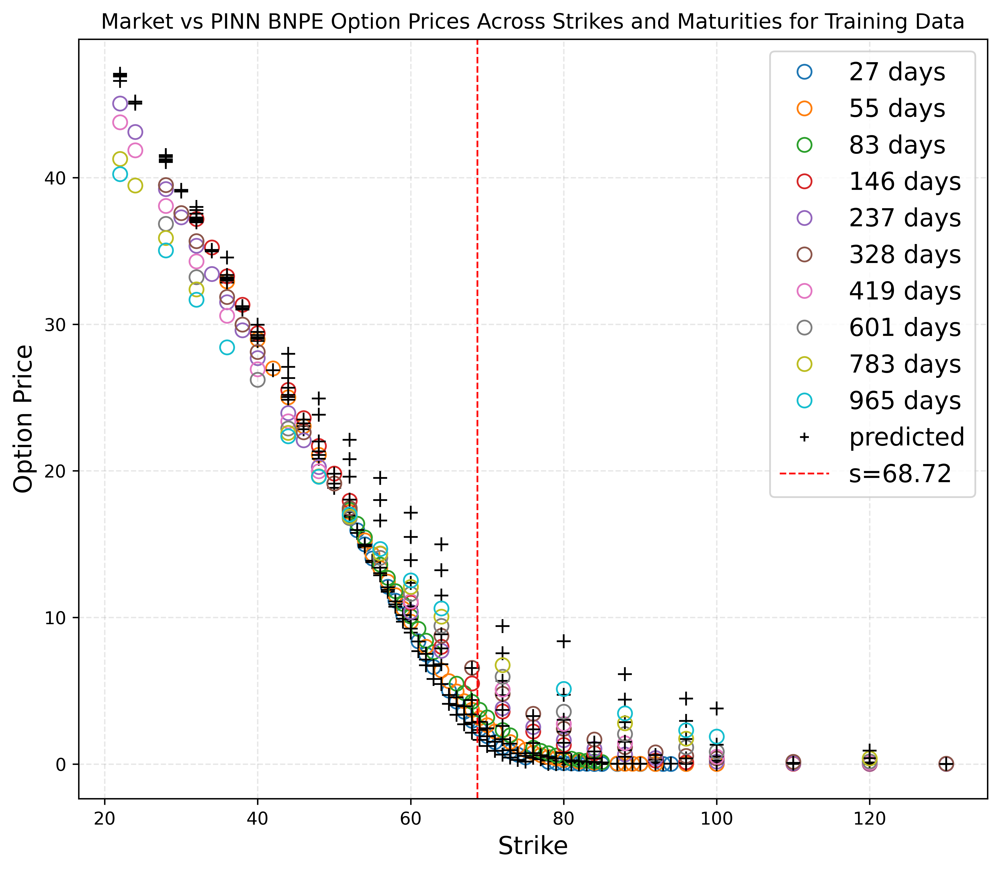

242.0


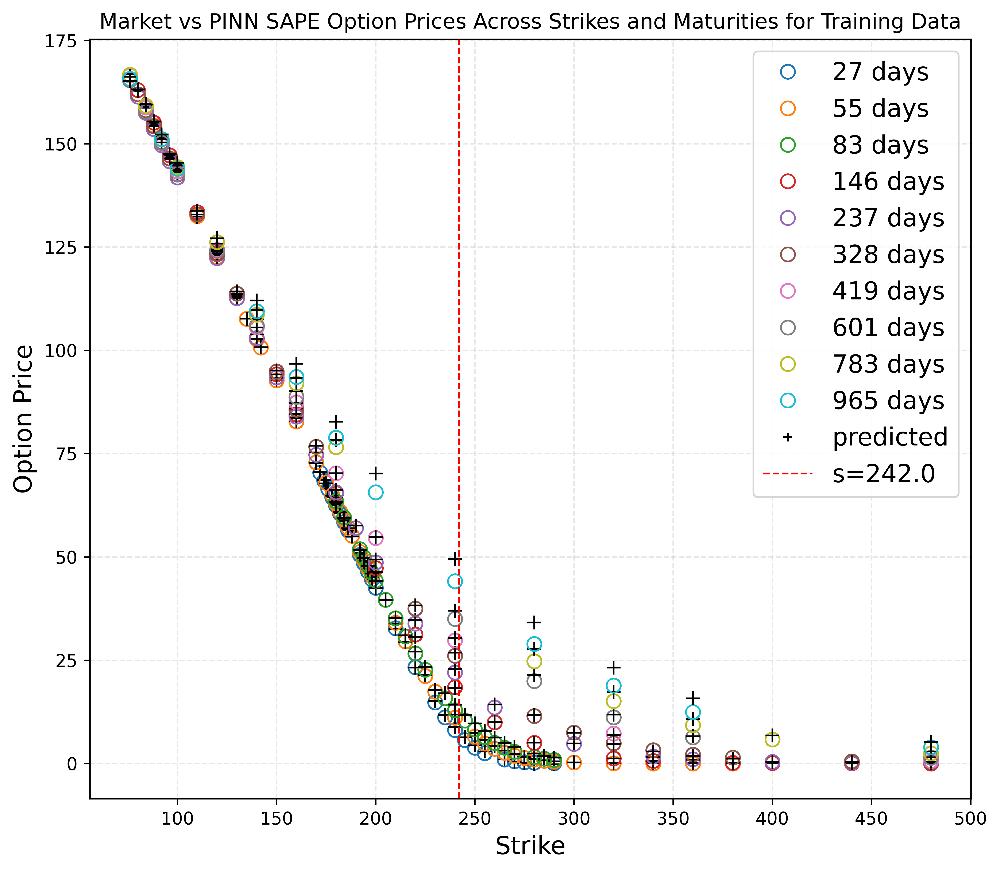

Test:


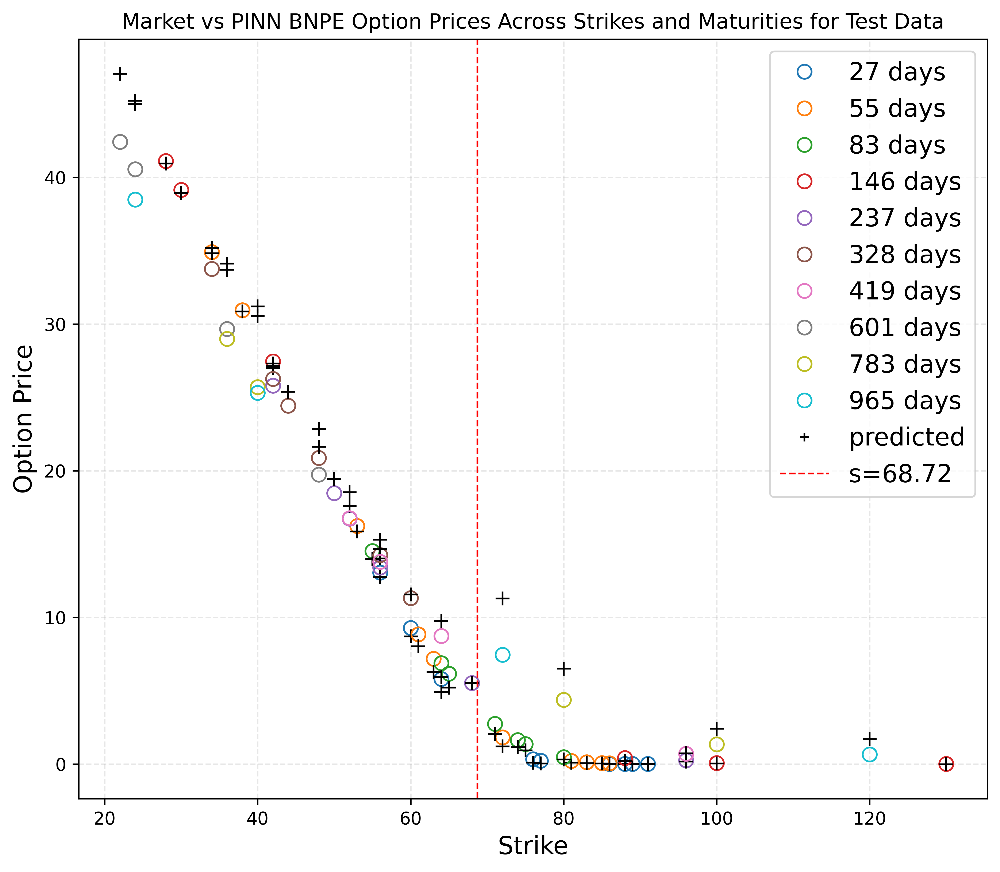

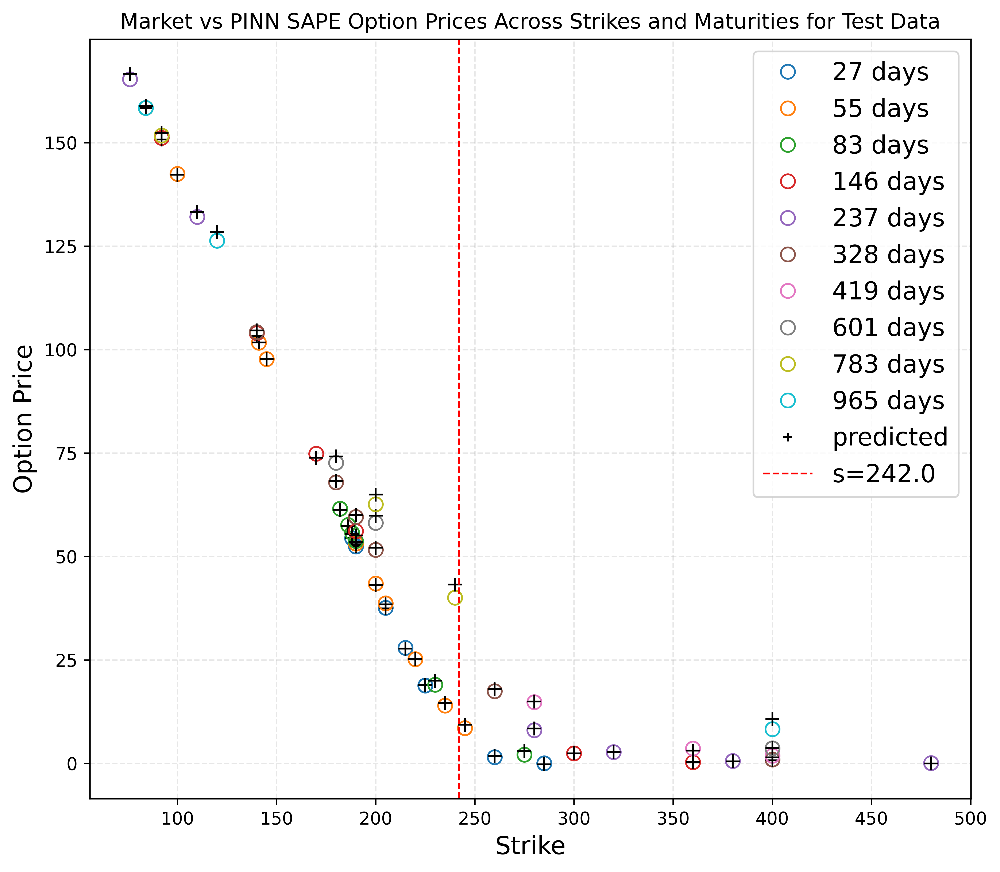

In [30]:
def plot_strike_slices(df, S0, plot_title):
    ttms = np.sort(df["time_to_maturity_years"].unique())
    ttm_days = (ttms * 365).astype(int)

    cmap = plt.get_cmap("tab10")
    fig, ax = plt.subplots(figsize=(8, 7), dpi=300)

    for i, (T, T_days) in enumerate(zip(ttms, ttm_days)):
        sub = df[df["time_to_maturity_years"] == T].sort_values("strike")
        color = cmap(i % 10)

        ax.plot(sub["strike"], sub["close"], marker="o", linestyle="none", markersize=8, markerfacecolor="none", markeredgecolor=color, label=f"{T_days} days")
        ax.plot(sub["strike"], sub["PINN_price"], marker="+", linestyle="none", markersize=8, color="k", label="_nolegend_")

    ax.plot([], [], marker="+", linestyle="none", color="k", markersize=5, label="predicted")
    ax.axvline(x=S0, linestyle='--', linewidth=1, label=f's={S0}', color='red')
    
    ax.set_xlabel("Strike", size=14)
    ax.set_ylabel("Option Price", size=14)
    ax.set_title(plot_title)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.legend(loc="upper right", fontsize=14)

    fig.tight_layout()
    plt.show()

print('Train:')
for i, df_train in enumerate(df_trains):
    ticker = tickers[i]
    S0 = stock_prices[i]
    print(S0)
    plot_title = f'Market vs PINN {ticker} Option Prices Across Strikes and Maturities for Training Data'
    plot_strike_slices(df_train, S0, plot_title)

print('Test:')
for i, df_test in enumerate(df_tests):
    ticker = tickers[i]
    S0 = stock_prices[i]
    plot_title = f'Market vs PINN {ticker} Option Prices Across Strikes and Maturities for Test Data'
    plot_strike_slices(df_test, S0, plot_title)

Train:


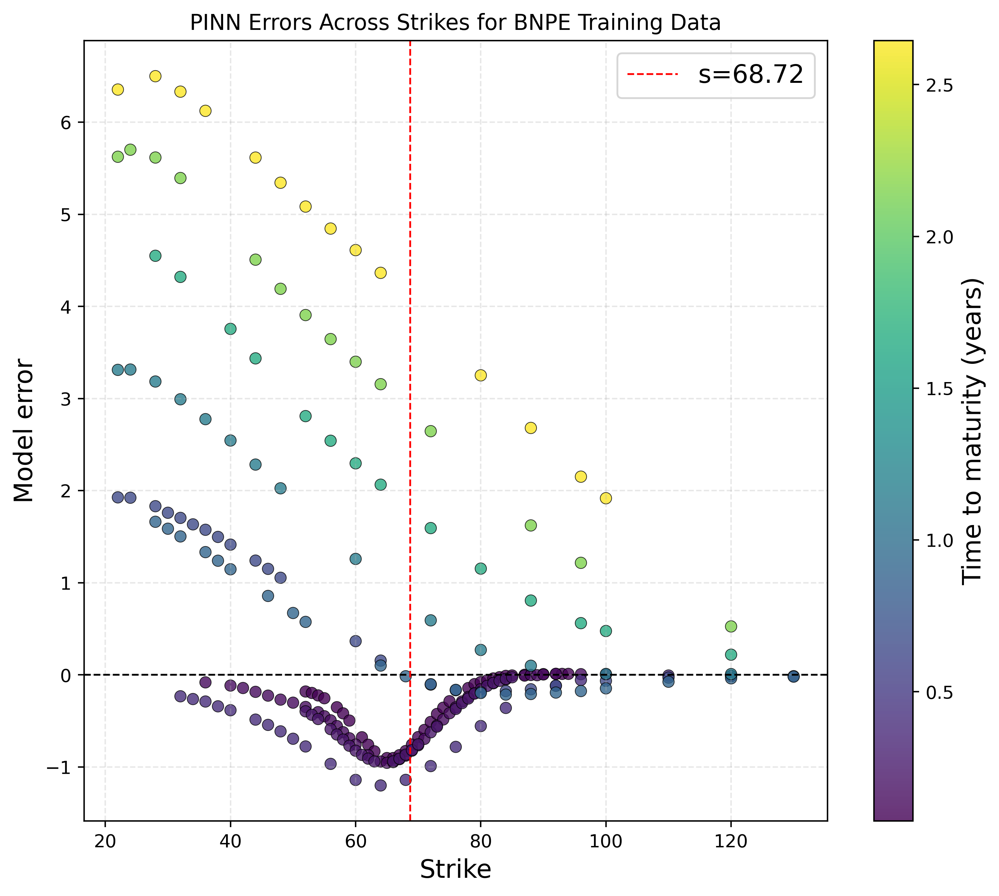

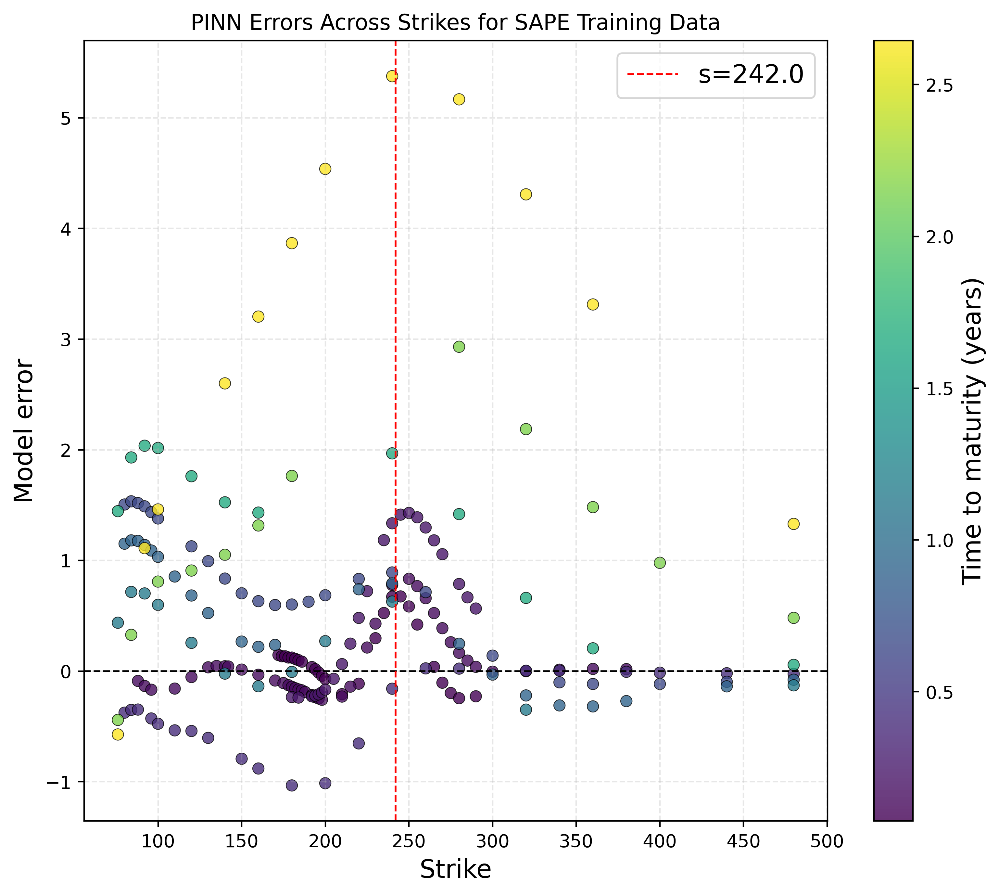

Test:


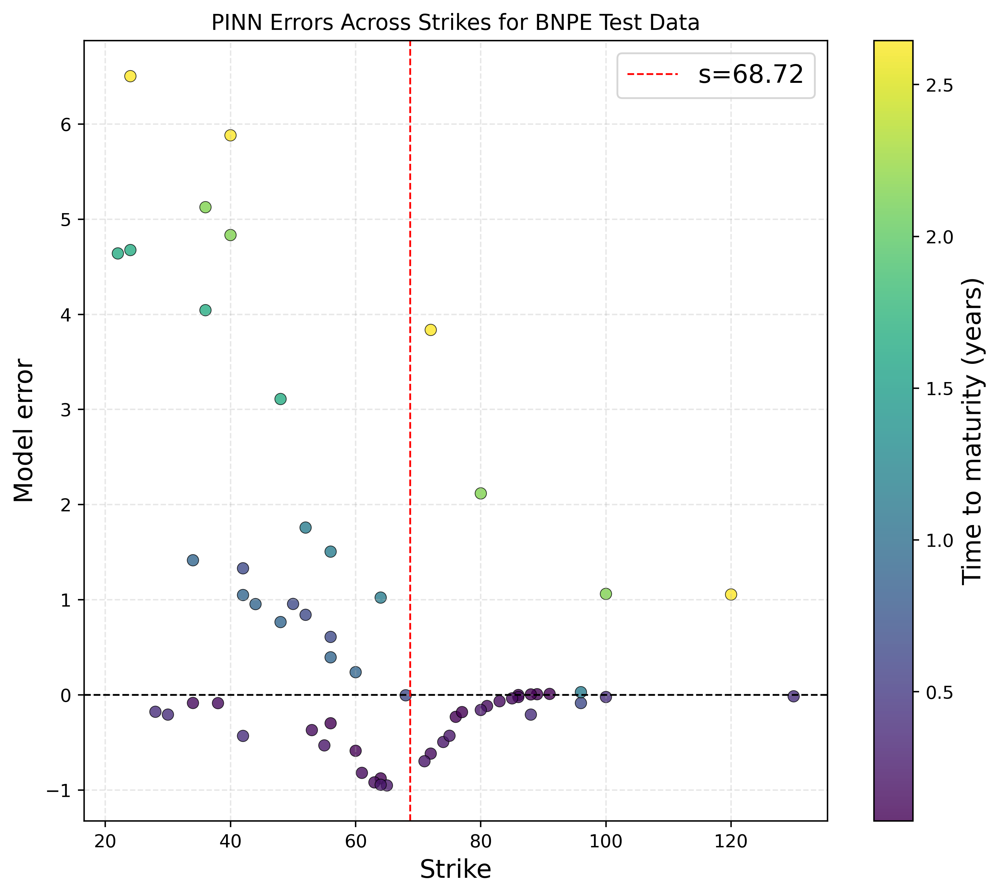

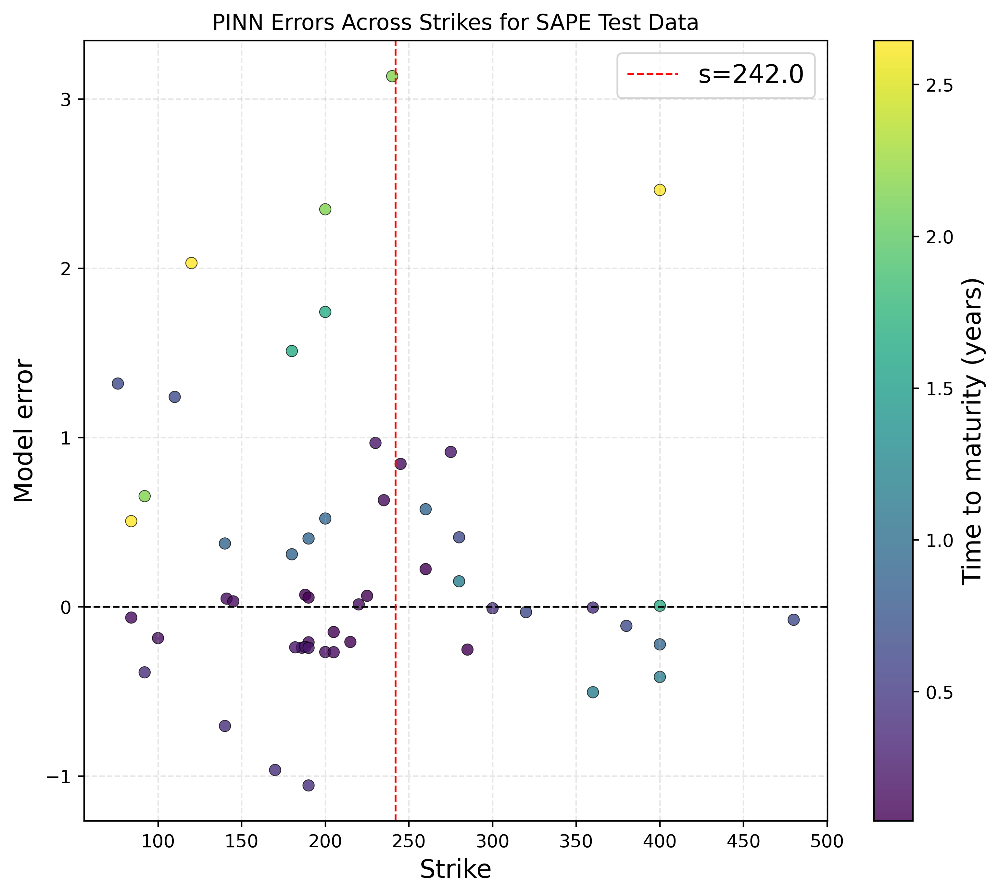

In [24]:
def plot_residuals_vs_strike(df, S0, plot_title):
    df = df.copy()
    
    fig, ax = plt.subplots(figsize=(8, 7), dpi=200)
    sc = ax.scatter(df["strike"], df["PINN_error"], c=df["time_to_maturity_years"], cmap="viridis", s=40, alpha=0.8, marker="o", edgecolors="k", linewidths=0.4)

    ax.axhline(0.0, color="k", linestyle="--", lw=1)
    ax.axvline(x=S0, linestyle='--', linewidth=1, label=f's={S0}', color='red')

    ax.set_xlabel('Strike', size=14)
    ax.set_ylabel('Model error', size=14)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.set_title(plot_title)
    ax.legend(loc="upper right", fontsize=14)

    cbar = fig.colorbar(sc, ax=ax)
    #cbar.ax.tick_params(labelsize=15)
    cbar.set_label("Time to maturity (years)", size=14)

    fig.tight_layout()
    plt.show()

print('Train:')
for i, df_train in enumerate(df_trains):
    ticker = tickers[i]
    S0 = stock_prices[i]
    plot_title = f'PINN Errors Across Strikes for {ticker} Training Data'
    plot_residuals_vs_strike(df_train, S0, plot_title)

print('Test:')
for i, df_test in enumerate(df_tests):
    ticker = tickers[i]
    S0 = stock_prices[i]
    plot_title = f'PINN Errors Across Strikes for {ticker} Test Data'
    plot_residuals_vs_strike(df_test, S0, plot_title)

## 3.4 Errors

In [25]:
train_errors_df_PINN

,TKR,MAE,RMSE,MAPE
0,BNPE,1.144893,1.885287,27.210996
1,SAPE,0.685811,1.116422,12.484229


In [26]:
test_errors_df_PINN

,TKR,MAE,RMSE,MAPE
0,BNPE,1.174457,1.996202,26.976203
1,SAPE,0.577784,0.898033,10.350069


In [27]:
df_PINN

,TKR,S0,r0,nu0,beta0,beta1,beta2,beta3,a1,a2,x0,kappa_r,theta_r,sigma_r,kappa_nu,theta_nu,sigma_nu,rho
0,BNPE,68.72,0.019167,0.051604,0.009864,0.009304,-0.003415,0.057249,0.533535,0.072648,0.10071,0.010245,0.032455,0.025787,1.049468,0.012313,0.160757,-0.458298
1,SAPE,242.00,0.019167,0.080731,0.009864,0.009304,-0.003415,0.057249,0.533535,0.072648,0.10071,0.010245,0.032455,0.025787,0.950243,0.026121,0.222784,-0.316593


In [28]:
BNPE = pd.concat([df_trains[0], df_tests[0]], ignore_index=True)
SAPE = pd.concat([df_trains[1], df_tests[1]], ignore_index=True)

BNPE.to_excel('BNPE.xlsx', index=False)
SAPE.to_excel('SAPE.xlsx', index=False)